# Enhancing Grid Stability and Market Dynamics through Hybrid Forecasting of Renewable Energy.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
from scipy.stats.mstats import winsorize
from scipy.stats import skew
import plotly.graph_objects as go
from datetime import datetime, timedelta

warnings.filterwarnings("ignore")

In [2]:
#https://drive.google.com/file/d/1W8EhXWuqGLTPeT560-00HEb5m_gAdq2E/view?usp=drive_link

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# reading data using pandas
df = pd.read_csv("/content/drive/MyDrive/Energy_Data_20200920_20240118.csv")

# top 5 records
df.head()

,dtm,MIP,Solar_MW,Solar_capacity_mwp,Solar_installedcapacity_mwp,Wind_MW,SS_Price,boa_MWh,DA_Price
0,2020-09-20T00:00:00Z,20.06,0.0,2130.537493,2228.208777,996.284,2.50,0.0,32.17
1,2020-09-20T00:30:00Z,19.77,0.0,2130.537493,2228.208777,957.576,15.00,0.0,32.17
2,2020-09-20T01:00:00Z,28.68,0.0,2130.537493,2228.208777,941.044,47.95,0.0,32.00
3,2020-09-20T01:30:00Z,28.97,0.0,2130.537493,2228.208777,964.366,29.13,0.0,32.00
4,2020-09-20T02:00:00Z,28.19,0.0,2130.537493,2228.208777,918.432,28.95,0.0,31.99


* As we can see we're getting data for every half an hour ( meaning that we've half hourly freq data )

In [5]:
# converting the columns to lower case

df.columns = [col.lower() for col in df.columns]

df.head()

,dtm,mip,solar_mw,solar_capacity_mwp,solar_installedcapacity_mwp,wind_mw,ss_price,boa_mwh,da_price
0,2020-09-20T00:00:00Z,20.06,0.0,2130.537493,2228.208777,996.284,2.50,0.0,32.17
1,2020-09-20T00:30:00Z,19.77,0.0,2130.537493,2228.208777,957.576,15.00,0.0,32.17
2,2020-09-20T01:00:00Z,28.68,0.0,2130.537493,2228.208777,941.044,47.95,0.0,32.00
3,2020-09-20T01:30:00Z,28.97,0.0,2130.537493,2228.208777,964.366,29.13,0.0,32.00
4,2020-09-20T02:00:00Z,28.19,0.0,2130.537493,2228.208777,918.432,28.95,0.0,31.99


In [6]:
# converting dtm to datetime format

df["dtm"] = pd.to_datetime(df["dtm"])

df.head()

,dtm,mip,solar_mw,solar_capacity_mwp,solar_installedcapacity_mwp,wind_mw,ss_price,boa_mwh,da_price
0,2020-09-20 00:00:00+00:00,20.06,0.0,2130.537493,2228.208777,996.284,2.50,0.0,32.17
1,2020-09-20 00:30:00+00:00,19.77,0.0,2130.537493,2228.208777,957.576,15.00,0.0,32.17
2,2020-09-20 01:00:00+00:00,28.68,0.0,2130.537493,2228.208777,941.044,47.95,0.0,32.00
3,2020-09-20 01:30:00+00:00,28.97,0.0,2130.537493,2228.208777,964.366,29.13,0.0,32.00
4,2020-09-20 02:00:00+00:00,28.19,0.0,2130.537493,2228.208777,918.432,28.95,0.0,31.99


In [7]:
# checking the data shape

df.shape

(58368, 9)

* 58368 records ( No of data points )
* 9 features    ( No of columns )

In [8]:
# data range

print(f"We have data starting from {df['dtm'].min()} to {df['dtm'].max()}")

We have data starting from 2020-09-20 00:00:00+00:00 to 2024-01-18 23:30:00+00:00


In [9]:
# column names

df.columns

Index(['dtm', 'mip', 'solar_mw', 'solar_capacity_mwp',
       'solar_installedcapacity_mwp', 'wind_mw', 'ss_price', 'boa_mwh',
       'da_price'],
      dtype='object')

In [10]:
# about data types

df.dtypes

,0
dtm,"datetime64[ns, UTC]"
mip,float64
solar_mw,float64
solar_capacity_mwp,float64
solar_installedcapacity_mwp,float64
wind_mw,float64
ss_price,float64
boa_mwh,float64
da_price,float64


In [11]:
# more info about the data

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58368 entries, 0 to 58367
Data columns (total 9 columns):
 #   Column                       Non-Null Count  Dtype              
---  ------                       --------------  -----              
 0   dtm                          58368 non-null  datetime64[ns, UTC]
 1   mip                          57944 non-null  float64            
 2   solar_mw                     58293 non-null  float64            
 3   solar_capacity_mwp           58368 non-null  float64            
 4   solar_installedcapacity_mwp  58368 non-null  float64            
 5   wind_mw                      58265 non-null  float64            
 6   ss_price                     58368 non-null  float64            
 7   boa_mwh                      58265 non-null  float64            
 8   da_price                     58368 non-null  float64            
dtypes: datetime64[ns, UTC](1), float64(8)
memory usage: 4.0 MB


In [12]:
# describing about data

df.describe()

,mip,solar_mw,solar_capacity_mwp,solar_installedcapacity_mwp,wind_mw,ss_price,boa_mwh,da_price
count,57944.000000,58293.000000,58368.000000,58368.000000,58265.000000,58368.000000,58265.000000,58368.000000
mean,126.348576,229.457787,2213.596987,2341.437871,574.893562,127.410760,-1.568957,130.250985
std,94.390704,379.612198,128.528670,145.720673,438.389387,128.895991,22.146755,99.830685
min,-77.290000,0.000000,1863.496832,1955.199129,0.000000,-185.330000,-599.500000,-51.520000
25%,67.010000,0.000000,2140.826405,2253.403130,139.546000,59.900000,0.000000,69.617500
50%,100.820000,0.020532,2167.493256,2295.210540,514.076000,102.500000,0.000000,101.305000
75%,163.175000,328.293937,2294.087775,2437.900986,1063.746000,169.900000,0.000000,164.665000
max,1983.660000,1811.852940,2454.720780,2609.227457,1192.744000,4037.800000,0.000000,2196.220000


In [13]:
# checking if there are any nan values ( empty values )

df.isna().sum()

,0
dtm,0
mip,424
solar_mw,75
solar_capacity_mwp,0
solar_installedcapacity_mwp,0
wind_mw,103
ss_price,0
boa_mwh,103
da_price,0


In [14]:
fig = px.imshow(
    df.isna(),
    title='Seasonal Heatmap with NaN Values',
    aspect='auto',
    labels={'color': 'NaN'}
)

fig.show()

# Exploratory Data Analysis

In [15]:
# let's check the date ranges

print(f"We have data starting from {df['dtm'].min()} to {df['dtm'].max()}")

We have data starting from 2020-09-20 00:00:00+00:00 to 2024-01-18 23:30:00+00:00


In [16]:
# Count the occurrences of each unique value in the "solar_mw" column

df["solar_mw"].value_counts()

,count
solar_mw,
0.000000,28374
771.533920,2
0.000188,1
68.678428,1
81.527170,1
...,...
441.034384,1
421.503884,1
516.716140,1


In [17]:
# calculating the percentages of zero solar_mw values

28374/29919*100

94.83605735485811

* We can see most of the time ( 94.83% ) power generated from the solar is almost 0, we'll see more how it changes across time using time series plots in the future.

In [18]:
# Count the occurrences of each unique value in the "wind_mw" column

df["wind_mw"].value_counts()

,count
wind_mw,
0.000,3331
1182.880,8
1191.504,8
1188.064,8
1174.042,7
...,...
1104.780,1
1090.158,1
1062.524,1


In [19]:
# calculating the percentages of zero values in wind_mw

3331/49981*100

6.664532522358496

* The percentage of zero values for wind_mw is very less compared to solar_mw i.e 6.66%.

In [20]:
print(f"Minimum & Maximum power generated using solar_mw : {df['solar_mw'].min()} Mw - {df['solar_mw'].max()} Mw")
print(f"Minimum & Maximum power generated using wind_mw : {df['wind_mw'].min()} Mw - {df['wind_mw'].max()} Mw")

Minimum & Maximum power generated using solar_mw : 0.0 Mw - 1811.85294 Mw
Minimum & Maximum power generated using wind_mw : 0.0 Mw - 1192.744 Mw


In [21]:
# average power genarated using solar & wind

print(f"Average power generated using solar_mw is {df['solar_mw'].mean()} MW")
print(f"Average power generated using wind_mw is {df['wind_mw'].mean()} Mw")

Average power generated using solar_mw is 229.45778709007078 MW
Average power generated using wind_mw is 574.893562172831 Mw


In [22]:
# Plot distributions of each column
numeric_columns = df.select_dtypes(include=[np.number]).columns.tolist()

numeric_columns

['mip',
 'solar_mw',
 'solar_capacity_mwp',
 'solar_installedcapacity_mwp',
 'wind_mw',
 'ss_price',
 'boa_mwh',
 'da_price']

## Checking data across different times

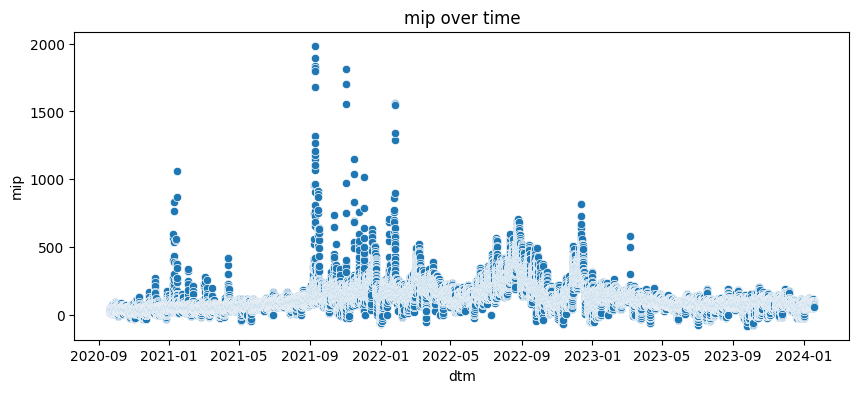

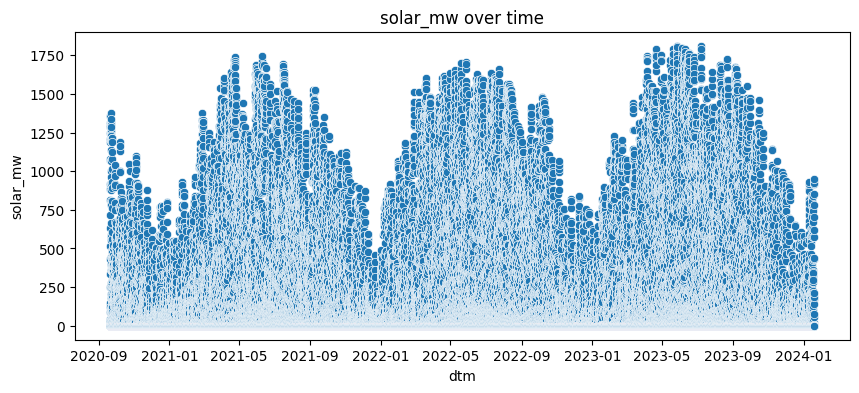

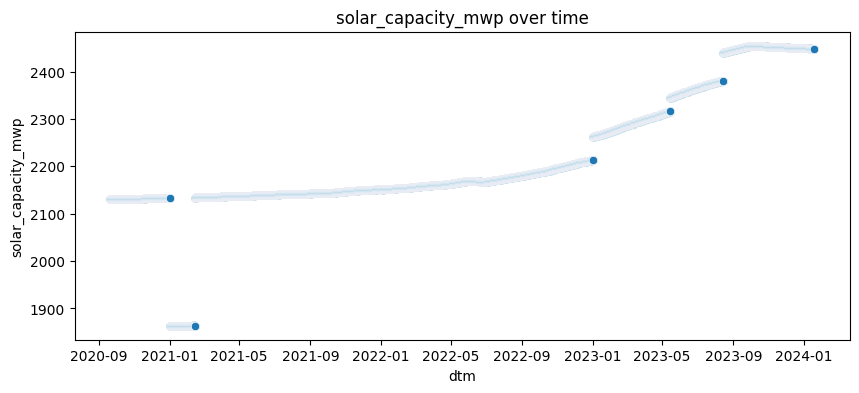

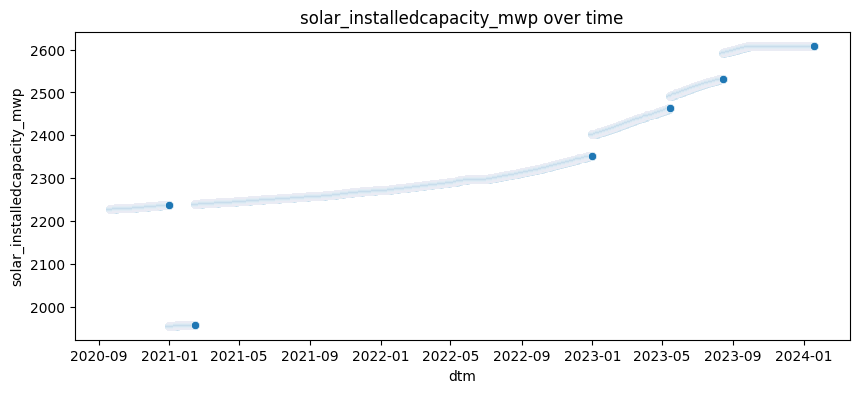

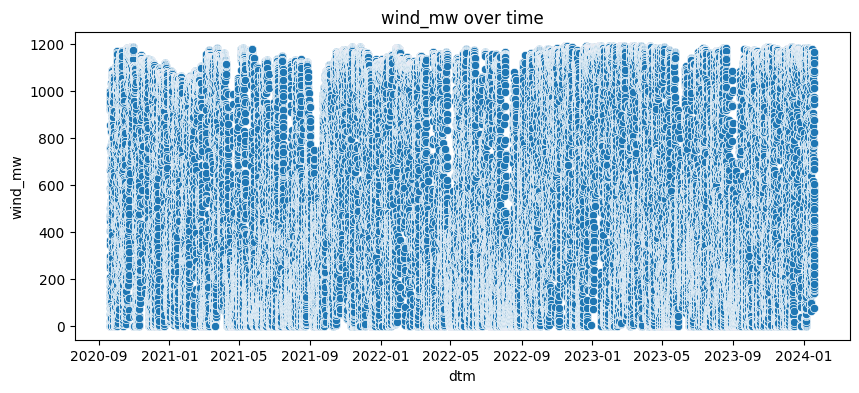

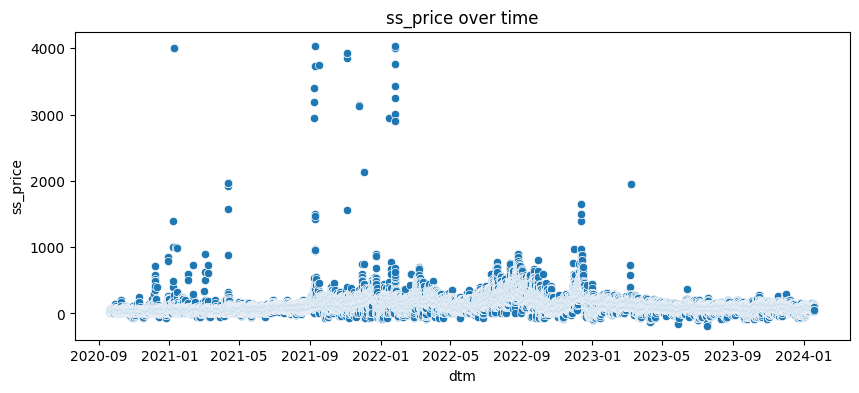

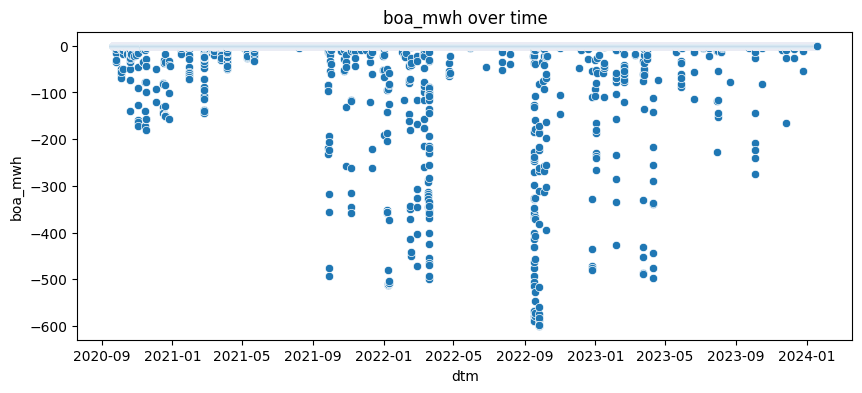

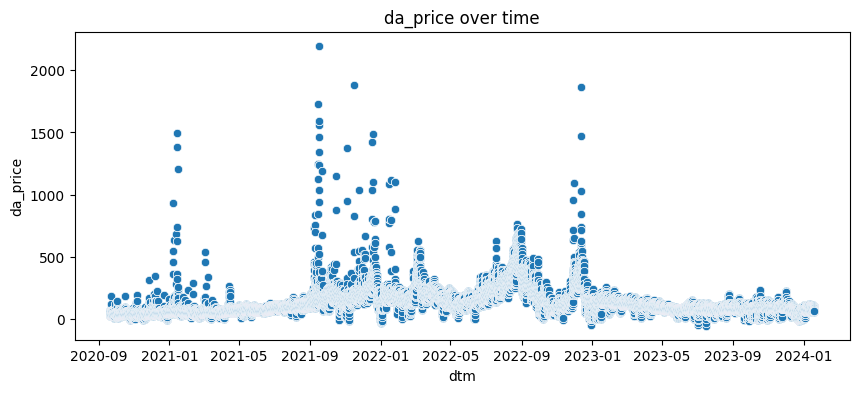

In [23]:
# Scatter plots for pairwise relationships
for col in numeric_columns:
    if col != 'dtm':  # Assuming 'dtm' is a datetime column
        plt.figure(figsize=(10, 4))
        sns.scatterplot(data=df, x='dtm', y=col)
        plt.title(f'{col} over time')
        plt.show()

In [24]:
# Extract year,  quarter, month, week, day, and time
df['year'] = df['dtm'].dt.year
df['quarter'] = df['dtm'].dt.quarter
df['month'] = df['dtm'].dt.month
df['week'] = df['dtm'].dt.isocalendar().week
df['day'] = df['dtm'].dt.day
df['time'] = df['dtm'].dt.time

In [25]:
df.head()

,dtm,mip,solar_mw,solar_capacity_mwp,solar_installedcapacity_mwp,wind_mw,ss_price,boa_mwh,da_price,year,quarter,month,week,day,time
0,2020-09-20 00:00:00+00:00,20.06,0.0,2130.537493,2228.208777,996.284,2.50,0.0,32.17,2020,3,9,38,20,00:00:00
1,2020-09-20 00:30:00+00:00,19.77,0.0,2130.537493,2228.208777,957.576,15.00,0.0,32.17,2020,3,9,38,20,00:30:00
2,2020-09-20 01:00:00+00:00,28.68,0.0,2130.537493,2228.208777,941.044,47.95,0.0,32.00,2020,3,9,38,20,01:00:00
3,2020-09-20 01:30:00+00:00,28.97,0.0,2130.537493,2228.208777,964.366,29.13,0.0,32.00,2020,3,9,38,20,01:30:00
4,2020-09-20 02:00:00+00:00,28.19,0.0,2130.537493,2228.208777,918.432,28.95,0.0,31.99,2020,3,9,38,20,02:00:00


In [26]:
# grouping by year & quarter

solar_grouped = df.groupby(by=["year","quarter"])["solar_mw"].sum().reset_index()
solar_grouped.head()

,year,quarter,solar_mw
0,2020,3,1.087523e+05
1,2020,4,4.017349e+05
2,2021,1,5.752062e+05
3,2021,2,1.548935e+06
4,2021,3,1.318648e+06


In [27]:
# solar_grouped = solar_grouped.sort_values(by=["year","quarter"])
solar_grouped["quarter"] = solar_grouped["quarter"].astype("str")

In [28]:
# Creating multiline plot for solar_mw across years
fig = px.line(solar_grouped.sort_values(by=["quarter"]), x='quarter', y='solar_mw', color='year', title='Total Solar Power Generation Across Years by Quarter')

# Show the plot
fig.show()

* The solar_mw in Q4 across years [2020,2021,2022,2023,2024] is almost same ( very lite deviation )

In [29]:
solar_grouped_month = df.groupby(by=["year","month"])["solar_mw"].sum().reset_index()
solar_grouped_month.head()

,year,month,solar_mw
0,2020,9,108752.296172
1,2020,10,180490.592757
2,2020,11,137103.414801
3,2020,12,84140.883929
4,2021,1,92067.507980


In [30]:
# Creating multiline plot for solar_mw across years
fig = px.line(solar_grouped_month.sort_values(by=["month"]), x='month', y='solar_mw', color='year', title='Total Solar Power Generation Across Years by Months')

# Show the plot
fig.show()

In [31]:
solar_grouped_week = df.groupby(by=["year","week"])["solar_mw"].sum().reset_index()
solar_grouped_week.head()

,year,week,solar_mw
0,2020,38,16979.128526
1,2020,39,68631.825055
2,2020,40,39664.955267
3,2020,41,56434.717935
4,2020,42,40566.706722


In [32]:
# Creating multiline plot for solar_mw across years
fig = px.line(solar_grouped_week.sort_values(by=["week"]), x='week', y='solar_mw', color='year', title='Total Solar Power Generation Across Years by Weeks')

# Show the plot
fig.show()

### Univariate Analysis ( Checking the distribution of different features )

In [33]:
# Plot distributions of each column
for col in numeric_columns:
    fig = px.histogram(df, x=col, title=f'Distribution of {col}', nbins=20)
    fig.show()

* Most of the features are highly Skewed, let's plot the box plots to see any potential outliers

In [34]:
for col in numeric_columns:
    fig = px.box(df, y=col, title=f'Boxplot of {col}')
    fig.show()

* We'll take care outliers & nan values after performing all the EDA

### Bivariate Analysis

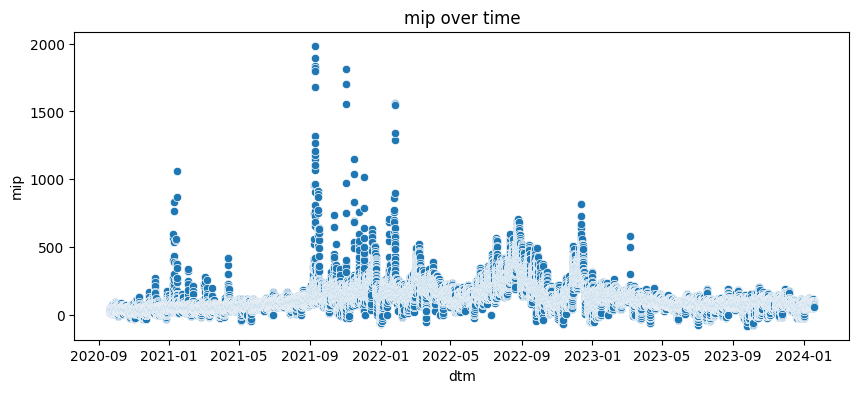

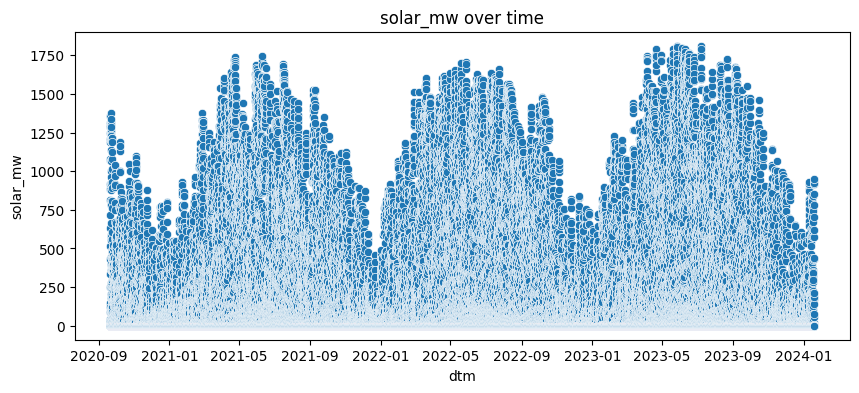

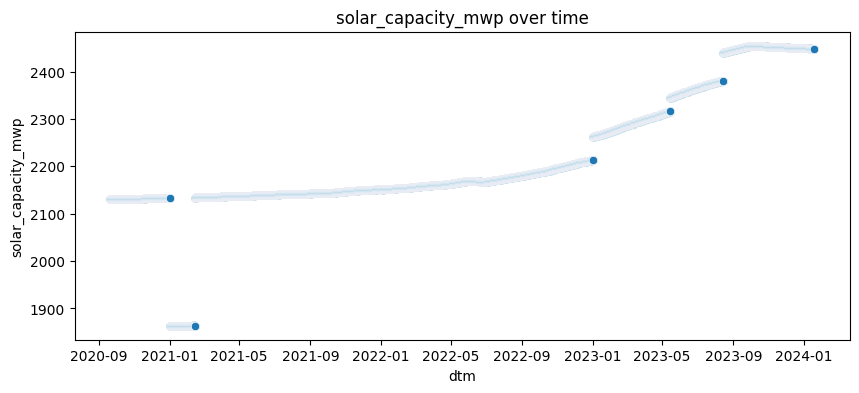

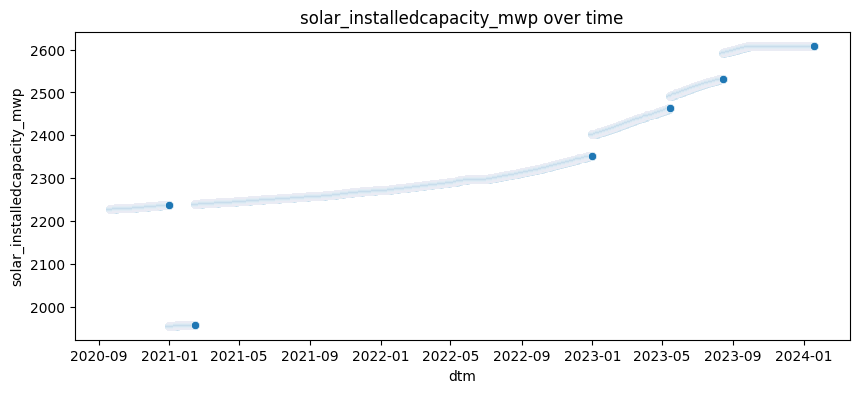

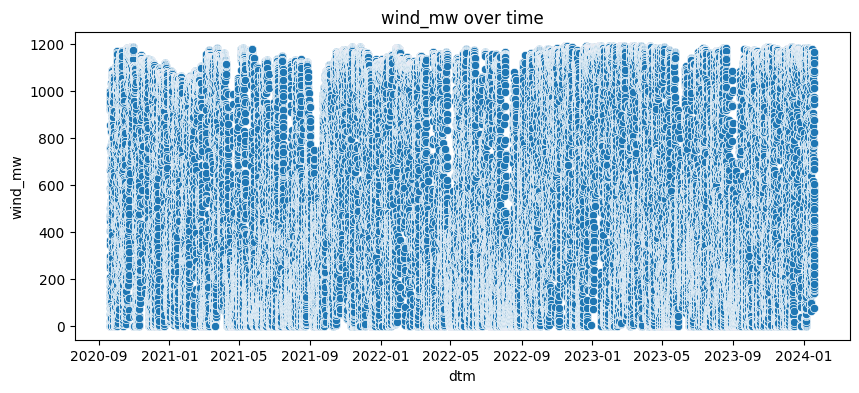

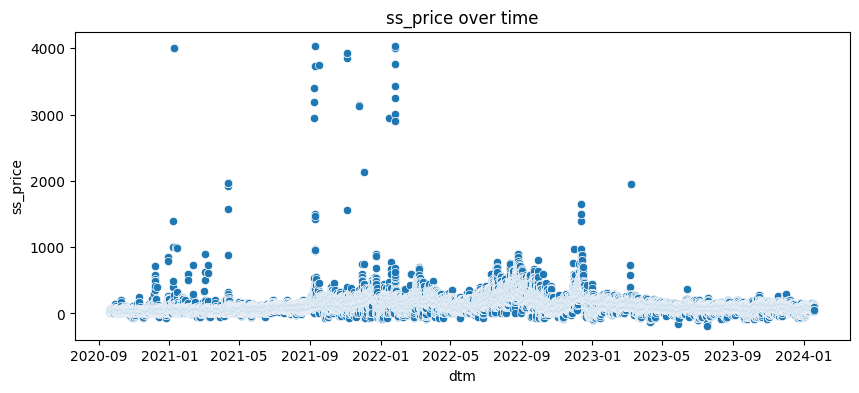

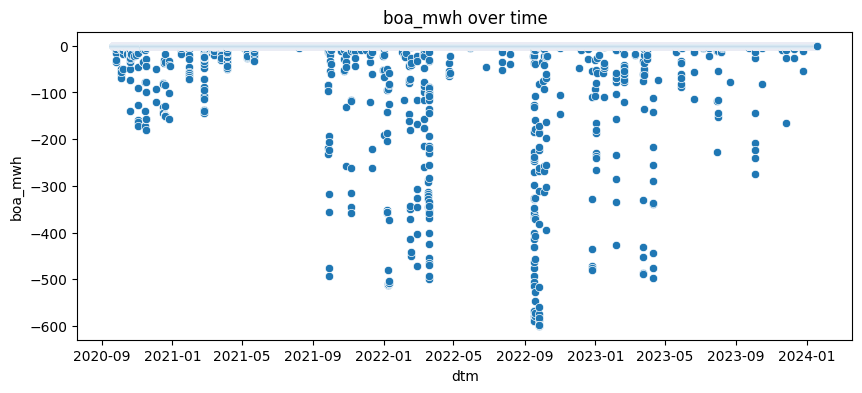

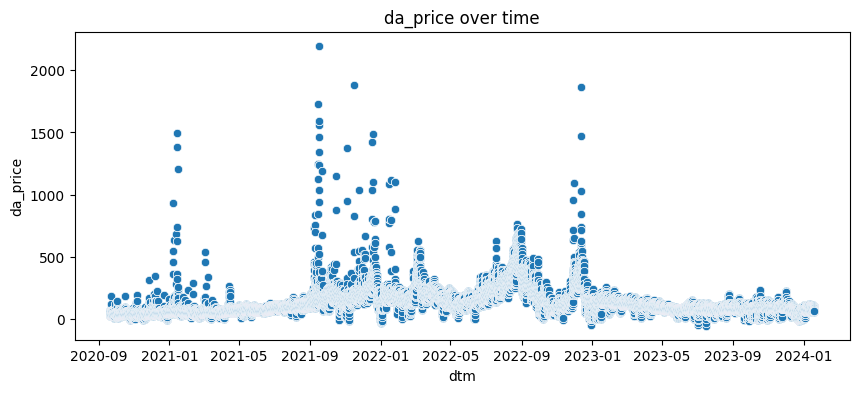

In [35]:
# Scatter plots for pairwise relationships
for col in numeric_columns:
    if col != 'dtm':  # Assuming 'dtm' is a datetime column
        plt.figure(figsize=(10, 4))
        sns.scatterplot(data=df, x='dtm', y=col)
        plt.title(f'{col} over time')
        plt.show()

## Data Preprocessing

* Even though we have extreme data points in our time series data, we should not delete any of those because it might cause discrepancies in the frequency of the data. Therefore, it is better to handle the outliers using other techniques such as differencing, winsorization, and so on.

In [36]:
# handling missing data ( NaN Values )

df.isna().sum()

,0
dtm,0
mip,424
solar_mw,75
solar_capacity_mwp,0
solar_installedcapacity_mwp,0
wind_mw,103
ss_price,0
boa_mwh,103
da_price,0
year,0


In [37]:
# let's see the records having mip as nan values

df[df["mip"].isna()].head()

,dtm,mip,solar_mw,solar_capacity_mwp,solar_installedcapacity_mwp,wind_mw,ss_price,boa_mwh,da_price,year,quarter,month,week,day,time
2243,2020-11-05 17:30:00+00:00,NaN,0.0,2131.68543,2231.630429,29.218,145.0,0.0,150.0,2020,4,11,45,5,17:30:00
2244,2020-11-05 18:00:00+00:00,NaN,0.0,2131.68543,2231.630429,28.714,22.0,0.0,66.2,2020,4,11,45,5,18:00:00
2245,2020-11-05 18:30:00+00:00,NaN,0.0,2131.68543,2231.630429,35.218,22.0,0.0,66.2,2020,4,11,45,5,18:30:00
2246,2020-11-05 19:00:00+00:00,NaN,0.0,2131.68543,2231.630429,39.706,75.0,0.0,45.1,2020,4,11,45,5,19:00:00
2247,2020-11-05 19:30:00+00:00,NaN,0.0,2131.68543,2231.630429,36.320,25.0,0.0,45.1,2020,4,11,45,5,19:30:00


In [38]:
df[df["mip"].isna()].tail()

,dtm,mip,solar_mw,solar_capacity_mwp,solar_installedcapacity_mwp,wind_mw,ss_price,boa_mwh,da_price,year,quarter,month,week,day,time
57944,2024-01-10 04:00:00+00:00,NaN,0.000000,2448.864445,2609.200511,275.256,62.0,0.0,75.34,2024,1,1,2,10,04:00:00
57945,2024-01-10 04:30:00+00:00,NaN,0.000000,2448.864445,2609.200511,251.576,62.0,0.0,75.34,2024,1,1,2,10,04:30:00
58106,2024-01-13 13:00:00+00:00,NaN,518.815948,2448.692989,2609.200511,642.382,106.9,0.0,75.27,2024,1,1,2,13,13:00:00
58141,2024-01-14 06:30:00+00:00,NaN,0.000000,2448.635861,2609.200511,544.340,60.0,0.0,69.84,2024,1,1,2,14,06:30:00
58161,2024-01-14 16:30:00+00:00,NaN,0.000000,2448.635861,2609.200511,1151.240,125.3,0.0,94.95,2024,1,1,2,14,16:30:00


In [39]:
# checking during which day we're having nan values for mip

df[df["mip"].isna()].groupby(by=["year","month","day"])["day"].value_counts()

year  month  day
2020  11     5      13
             6       5
2021  1      4       3
             6       6
             19      2
      3      1      18
             21      1
      5      10      2
      6      23      3
      7      2       2
             3       1
      8      5      17
      9      16      2
      11     16      1
2022  4      12      3
             24      3
             25     19
      5      31      2
      9      28      2
      10     22     16
             28     18
             29     19
             30      3
      11     9       2
2023  1      22     38
             23     15
      2      26      6
             27     20
      3      9       8
             10     17
             18      1
             31      2
      4      1      20
             26      3
      7      4       1
             19      3
      8      11      2
      9      22      2
      10     16      4
             27     16
      11     11     33
             12     48
             13     17
2024  1      10      2
             13      1
             14      2
Name: count, dtype: int64

* The count value is nothing but the number of missing values on a particular day.

In [40]:
# let's see if we've any value for wind_mw when we've nan value for mip

df[(df["mip"].isna())&(df["wind_mw"].isna())]

,dtm,mip,solar_mw,solar_capacity_mwp,solar_installedcapacity_mwp,wind_mw,ss_price,boa_mwh,da_price,year,quarter,month,week,day,time


* We don't have any records in which both mip & wind_mw are NaN, now let's separately look at records having wind_mw as nan

In [41]:
# records having wind_mw as nan

df[df["wind_mw"].isna()].head()

,dtm,mip,solar_mw,solar_capacity_mwp,solar_installedcapacity_mwp,wind_mw,ss_price,boa_mwh,da_price,year,quarter,month,week,day,time
20208,2021-11-15 00:00:00+00:00,103.27,0.0,2148.261649,2266.665940,NaN,-44.00,NaN,134.35,2021,4,11,46,15,00:00:00
20209,2021-11-15 00:30:00+00:00,100.62,0.0,2148.261649,2266.665940,NaN,85.00,NaN,134.35,2021,4,11,46,15,00:30:00
20210,2021-11-15 01:00:00+00:00,111.96,0.0,2148.261649,2266.665940,NaN,115.00,NaN,127.16,2021,4,11,46,15,01:00:00
20211,2021-11-15 01:30:00+00:00,116.94,0.0,2148.261649,2266.665940,NaN,118.20,NaN,127.16,2021,4,11,46,15,01:30:00
47374,2023-06-03 23:00:00+00:00,66.07,0.0,2353.361577,2501.223133,NaN,66.07,NaN,66.85,2023,2,6,22,3,23:00:00


* Records having wind_mw are also having boa_mwh as nan

In [42]:
df[df["wind_mw"].isna()].shape

(103, 15)

In [43]:
df_latest = df.copy()

In [44]:
df_latest.isna().sum()

,0
dtm,0
mip,424
solar_mw,75
solar_capacity_mwp,0
solar_installedcapacity_mwp,0
wind_mw,103
ss_price,0
boa_mwh,103
da_price,0
year,0


In [45]:
# let's first fill the nan values with simple approaches, if we're not getting good results then we can go for other approaches as well
nan_cols = ["mip","solar_mw","wind_mw","boa_mwh"]

for col in nan_cols:
    df_latest[col].fillna(np.mean(df_latest[col]),inplace=True)

In [46]:
df_latest.isna().sum()

,0
dtm,0
mip,0
solar_mw,0
solar_capacity_mwp,0
solar_installedcapacity_mwp,0
wind_mw,0
ss_price,0
boa_mwh,0
da_price,0
year,0


In [47]:
# As we've imputed the nan values, let's start cleaning up the outliers



In [48]:
winsorize_cols  = df_latest.drop(columns=["da_price","year","quarter","month","week","day"]).select_dtypes(include=[np.number]).columns.to_list()
winsorize_cols

['mip',
 'solar_mw',
 'solar_capacity_mwp',
 'solar_installedcapacity_mwp',
 'wind_mw',
 'ss_price',
 'boa_mwh']

In [49]:
for feature in winsorize_cols:
    data_skewness = skew(df_latest[feature])

    print(f"{feature} is having a skweness of {data_skewness}",end=" --> ")

    if data_skewness > 0:
        print("the data is right-skewed.\n")
    elif data_skewness < 0:
        print("the data is left-skewed.\n")
    else:
        print("the data is symmetric (not skewed).\n")


mip is having a skweness of 3.005844093779153 --> the data is right-skewed.

solar_mw is having a skweness of 1.7796795707486328 --> the data is right-skewed.

solar_capacity_mwp is having a skweness of 0.14532736826092824 --> the data is right-skewed.

solar_installedcapacity_mwp is having a skweness of 0.16415289438215028 --> the data is right-skewed.

wind_mw is having a skweness of 0.1039908654533285 --> the data is right-skewed.

ss_price is having a skweness of 10.201093384058819 --> the data is right-skewed.

boa_mwh is having a skweness of -18.48598559684595 --> the data is left-skewed.



In [50]:
# # Applying winsorization based on skewness

# lower_limit = 0.05  # Lower bound ( 5th percentile )
# upper_limit = 0.95  # upper bound ( 95th percentile )

# df_winsorized = pd.DataFrame()

# # copying date feature
# df_winsorized["dtm"] = df_latest["dtm"]

# for col in winsorize_cols:
#     col_skewness = skew(df_latest[col])

#     if col_skewness > 0:  # Right skewed
#         winsorized_col = winsorize(df_latest[col], limits=(0.5,0))
#     elif col_skewness < 0:  # Left skewed
#         winsorized_col = winsorize(df_latest[col], limits=(lower_limit, upper_limit))
#     else:  # Symmetric
#         winsorized_col = winsorize(df_latest[col], limits=(lower_limit, upper_limit))

#     df_winsorized[col + '_winsorized'] = winsorized_col

In [51]:
# df_winsorized.head()

In [52]:
# df_winsorized["mip_winsorized"].value_counts()

In [53]:
# # now let's check the data distribution

# # Plot distributions of each column after winsorization

# for col in winsorize_cols:
#     fig = px.histogram(df_winsorized, x=col+"_winsorized", title=f'Distribution of {col}', nbins=20)
#     fig.show()

In [54]:
df_latest.columns

Index(['dtm', 'mip', 'solar_mw', 'solar_capacity_mwp',
       'solar_installedcapacity_mwp', 'wind_mw', 'ss_price', 'boa_mwh',
       'da_price', 'year', 'quarter', 'month', 'week', 'day', 'time'],
      dtype='object')

# Model Building

### Base Model with VAR (Vector Auto-Regression)


In [55]:
pip install statsmodels

In [56]:
from statsmodels.tsa.api import VAR
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [57]:
df_latest = df_latest.sort_values(by='dtm')

# Perform train-test split based on index (80-20 rule)
split_index = int(len(df) * 0.8)
train_df = df_latest.iloc[:split_index]
test_df = df_latest.iloc[split_index:]

In [58]:
# selecting base features for the VAR model
features = ['mip', 'solar_mw', 'solar_capacity_mwp', 'solar_installedcapacity_mwp', 'wind_mw', 'ss_price', 'boa_mwh', 'da_price']

train_data = train_df[features]
test_data = test_df[features]

# fitting a VAR model to the training data
model = VAR(train_data)
model_fit = model.fit(maxlags=15, ic='aic')

In [59]:
# forecasting the next steps
forecast_steps = len(test_data)
forecast = model_fit.forecast(train_data.values[-model_fit.k_ar:], steps=forecast_steps)

In [60]:
# converting forecast to DataFrame
forecast_df = pd.DataFrame(forecast, index=test_df.index, columns=features)


In [61]:
def normalize(array):
    min_val = np.min(array)
    max_val = np.max(array)

    normalized_array = (array - min_val) / (max_val - min_val)
    return normalized_array

In [62]:
# calculate accuracy metrics for 'da_price'
mse = mean_squared_error(normalize(test_data['da_price']), normalize(forecast_df['da_price']))
mae = mean_absolute_error(normalize(test_data["da_price"]),normalize(forecast_df["da_price"]))

print(f'Mean Squared Error: {mse}')
print(f"Mean Absolute Error: {mae}")

Mean Squared Error: 0.22664243538788528
Mean Absolute Error: 0.460237268207226


In [63]:
# creating the figure
fig = go.Figure()

# Adding traces for training data, actual data, and predicted data
fig.add_trace(go.Scatter(x=train_df['dtm'], y=train_df['da_price'], mode='lines', name='Training Data'))
fig.add_trace(go.Scatter(x=test_df['dtm'], y=test_df['da_price'], mode='lines', name='Actual Data'))
fig.add_trace(go.Scatter(x=test_df['dtm'], y=forecast_df['da_price'], mode='lines', name='Predicted Data', line=dict(dash='dash')))

# Updating the layout
fig.update_layout(
    title='Multivariate Time Series Forecasting (DA Price)',
    xaxis_title='Date',
    yaxis_title='DA Price',
    legend=dict(x=0, y=1, traceorder='normal', font=dict(size=12)),
    autosize=False,
    width=1000,
    height=600
)

fig.show()

In [64]:
# df_latest.isna().sum()

# Seasonal Decomposition

In [65]:
from statsmodels.tsa.seasonal import seasonal_decompose

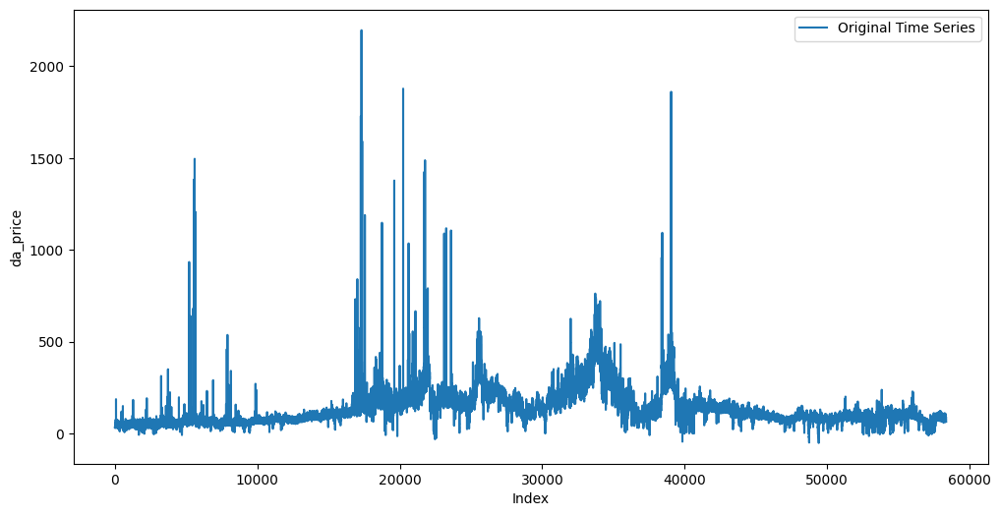

In [66]:
# Plot original time series
plt.figure(figsize=(12, 6))
plt.plot(df_latest["da_price"], label='Original Time Series')
plt.xlabel("Index")
plt.ylabel("da_price")
plt.legend(loc='best')
plt.show()

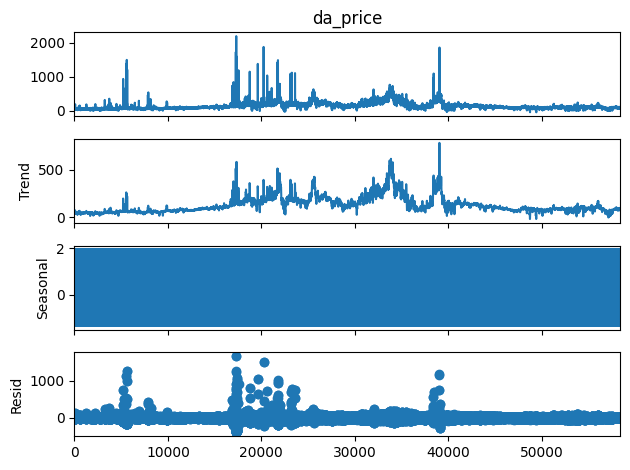

In [67]:
# Apply seasonal decomposition
decomposition = seasonal_decompose(df_latest["da_price"], model='additive', period=30)

# Plot the decomposed components
decomposition.plot()
plt.show()

In [68]:
# Accessing individual components
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

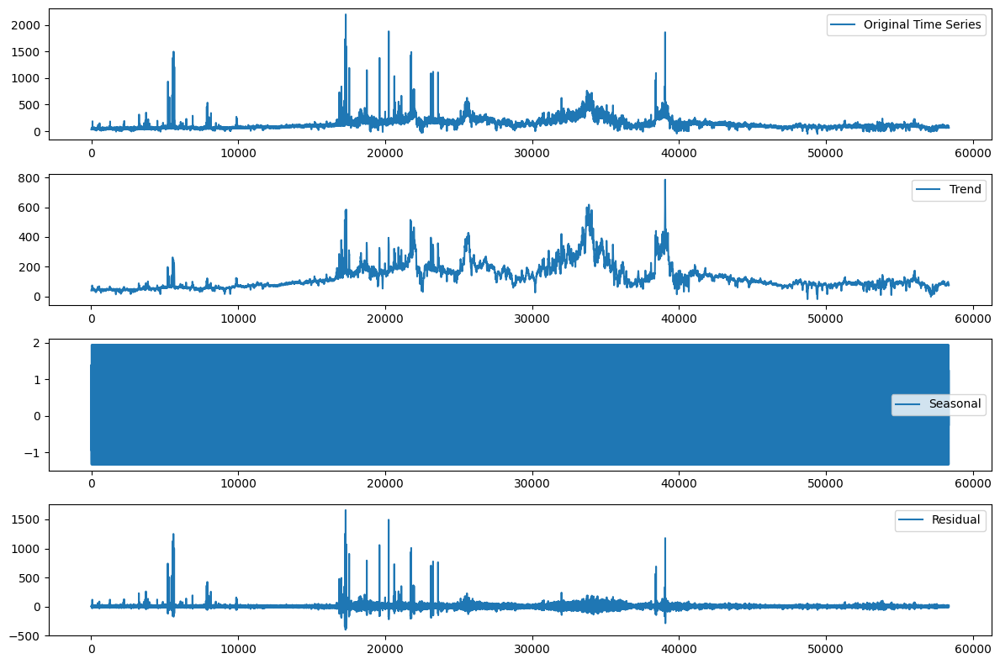

In [69]:
# Plotting the individual components
plt.figure(figsize=(12, 8))

plt.subplot(411)
plt.plot(df_latest["da_price"], label='Original Time Series')
plt.legend(loc='best')

plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='best')

plt.subplot(413)
plt.plot(seasonal, label='Seasonal')
plt.legend(loc='best')

plt.subplot(414)
plt.plot(residual, label='Residual')
plt.legend(loc='best')

plt.tight_layout()
plt.show()


* There's no seasonality in the data, so let's try some tree based instead of time series models

In [70]:
df_latest.columns

Index(['dtm', 'mip', 'solar_mw', 'solar_capacity_mwp',
       'solar_installedcapacity_mwp', 'wind_mw', 'ss_price', 'boa_mwh',
       'da_price', 'year', 'quarter', 'month', 'week', 'day', 'time'],
      dtype='object')

* As we don't have any seasonality in the data, let's try building some tree based models

In [71]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

In [72]:
df_latest.columns

Index(['dtm', 'mip', 'solar_mw', 'solar_capacity_mwp',
       'solar_installedcapacity_mwp', 'wind_mw', 'ss_price', 'boa_mwh',
       'da_price', 'year', 'quarter', 'month', 'week', 'day', 'time'],
      dtype='object')

In [73]:
# Split data
X = df_latest.drop(columns=["da_price","dtm","time"])
y = df_latest["da_price"]

In [74]:
tscv = TimeSeriesSplit(n_splits=5)
model = RandomForestRegressor(n_estimators=70, random_state=42)


param_grid = {'max_depth': [2, 5, 7],'n_estimators': [5, 10, 20]}

In [75]:
grid_search = GridSearchCV(model, param_grid, cv=tscv, scoring='neg_mean_squared_error')
grid_search.fit(X, y)

GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
             estimator=RandomForestRegressor(n_estimators=70, random_state=42),
             param_grid={'max_depth': [2, 5, 7], 'n_estimators': [5, 10, 20]},
             scoring='neg_mean_squared_error')

In [76]:
print(f'Best parameters: {grid_search.best_params_}')
print(f'Best RMSE: {np.sqrt(-grid_search.best_score_)}')

Best parameters: {'max_depth': 5, 'n_estimators': 20}
Best RMSE: 61.9754063885768


In [77]:
# Train the best model
best_model = grid_search.best_estimator_
best_model.fit(X, y)

RandomForestRegressor(max_depth=5, n_estimators=20, random_state=42)

RMSE: 44.3328439559671


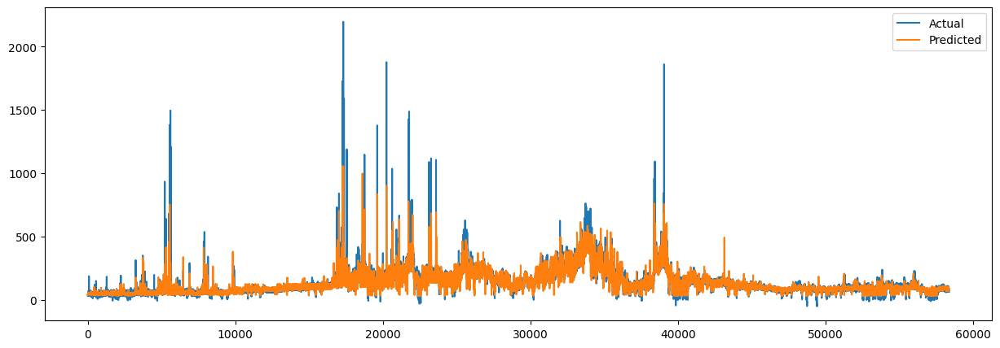

In [78]:
# Make predictions
y_pred = best_model.predict(X)

# Evaluate the model
rmse = np.sqrt(mean_squared_error(y, y_pred))
print(f'RMSE: {rmse}')

# Plot results
plt.figure(figsize=(15, 5))
plt.plot(df_latest.index, y, label='Actual')
plt.plot(df_latest.index, y_pred, label='Predicted')
plt.legend()
plt.show()

# Let's add few more features based on time and build a tree based model

In [79]:
def engineer_lag_features(df):

    print()
    df = df.sort_values("dtm")
    df["lag_1"] = df["da_price"].shift(1)

    df["rolling_mean_lag_1"] = df["lag_1"].rolling(window=6).mean()
    df["expanding_mean_lag_1"] = df["lag_1"].expanding().mean()

    return df

In [80]:
df_latest = engineer_lag_features(df_latest)

df_latest.columns

Index(['dtm', 'mip', 'solar_mw', 'solar_capacity_mwp',
       'solar_installedcapacity_mwp', 'wind_mw', 'ss_price', 'boa_mwh',
       'da_price', 'year', 'quarter', 'month', 'week', 'day', 'time', 'lag_1',
       'rolling_mean_lag_1', 'expanding_mean_lag_1'],
      dtype='object')

In [81]:
df_latest.head()

,dtm,mip,solar_mw,solar_capacity_mwp,solar_installedcapacity_mwp,wind_mw,ss_price,boa_mwh,da_price,year,quarter,month,week,day,time,lag_1,rolling_mean_lag_1,expanding_mean_lag_1
0,2020-09-20 00:00:00+00:00,20.06,0.0,2130.537493,2228.208777,996.284,2.50,0.0,32.17,2020,3,9,38,20,00:00:00,NaN,NaN,NaN
1,2020-09-20 00:30:00+00:00,19.77,0.0,2130.537493,2228.208777,957.576,15.00,0.0,32.17,2020,3,9,38,20,00:30:00,32.17,NaN,32.170000
2,2020-09-20 01:00:00+00:00,28.68,0.0,2130.537493,2228.208777,941.044,47.95,0.0,32.00,2020,3,9,38,20,01:00:00,32.17,NaN,32.170000
3,2020-09-20 01:30:00+00:00,28.97,0.0,2130.537493,2228.208777,964.366,29.13,0.0,32.00,2020,3,9,38,20,01:30:00,32.00,NaN,32.113333
4,2020-09-20 02:00:00+00:00,28.19,0.0,2130.537493,2228.208777,918.432,28.95,0.0,31.99,2020,3,9,38,20,02:00:00,32.00,NaN,32.085000


In [82]:
df_latest.isna().sum()

,0
dtm,0
mip,0
solar_mw,0
solar_capacity_mwp,0
solar_installedcapacity_mwp,0
wind_mw,0
ss_price,0
boa_mwh,0
da_price,0
year,0


In [83]:
# imputing nan values

df_latest.bfill(inplace=True,limit=10)

In [84]:
# df_latest.head(20)

In [85]:
df_latest.isna().sum()

,0
dtm,0
mip,0
solar_mw,0
solar_capacity_mwp,0
solar_installedcapacity_mwp,0
wind_mw,0
ss_price,0
boa_mwh,0
da_price,0
year,0


In [86]:
df_latest.to_csv("\content\drive\MyDrive\Energy_Demand.csv")

In [87]:
# # Split data
# X = df_latest.drop(columns=["da_price","dtm","time"])
# y = df_latest["da_price"]

In [88]:
def prepare_data_based_on_index(data):
    try:
        total_days = (data["dtm"].max() - data["dtm"].min()).days
        training_period = int(total_days * 0.78)
        cutoff = data["dtm"].min() + timedelta(days=training_period)
        cutoff = pd.to_datetime(cutoff)

        training_mask = data["dtm"] < cutoff
        training_data = data.loc[training_mask]

        testing_mask = data["dtm"] >= cutoff
        testing_data = data.loc[testing_mask]
        return training_data, testing_data
    except Exception as e:
        raise Exception("Error while preparing data based on index: " + str(e))

In [89]:
train_data, test_data = prepare_data_based_on_index(df_latest.drop(columns=["time"]))

train_data.head()

,dtm,mip,solar_mw,solar_capacity_mwp,solar_installedcapacity_mwp,wind_mw,ss_price,boa_mwh,da_price,year,quarter,month,week,day,lag_1,rolling_mean_lag_1,expanding_mean_lag_1
0,2020-09-20 00:00:00+00:00,20.06,0.0,2130.537493,2228.208777,996.284,2.50,0.0,32.17,2020,3,9,38,20,32.17,32.053333,32.170000
1,2020-09-20 00:30:00+00:00,19.77,0.0,2130.537493,2228.208777,957.576,15.00,0.0,32.17,2020,3,9,38,20,32.17,32.053333,32.170000
2,2020-09-20 01:00:00+00:00,28.68,0.0,2130.537493,2228.208777,941.044,47.95,0.0,32.00,2020,3,9,38,20,32.17,32.053333,32.170000
3,2020-09-20 01:30:00+00:00,28.97,0.0,2130.537493,2228.208777,964.366,29.13,0.0,32.00,2020,3,9,38,20,32.00,32.053333,32.113333
4,2020-09-20 02:00:00+00:00,28.19,0.0,2130.537493,2228.208777,918.432,28.95,0.0,31.99,2020,3,9,38,20,32.00,32.053333,32.085000


In [90]:
x_train = train_data.drop(columns=["da_price","day"])
y_train = train_data["da_price"]

x_test = test_data.drop(columns=["da_price","day"])
y_test = test_data["da_price"]

In [91]:
print("Shape of X_train",x_train.shape)
print("Shape of Y_train",y_train.shape)
print("Shape of X_test",x_test.shape)
print("Shape of Y_test",y_test.shape)

Shape of X_train (45456, 15)
Shape of Y_train (45456,)
Shape of X_test (12912, 15)
Shape of Y_test (12912,)


In [92]:
tscv = TimeSeriesSplit(n_splits=5)
model = RandomForestRegressor(n_estimators=70, random_state=42)


param_grid = {
    'max_depth': [10, 20, 50],
    'n_estimators': [10, 50, 100]}

In [93]:
grid_search = GridSearchCV(model, param_grid, cv=tscv, scoring='neg_mean_squared_error')
grid_search.fit(x_train.drop(columns=["dtm"]), y_train)

GridSearchCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
             estimator=RandomForestRegressor(n_estimators=70, random_state=42),
             param_grid={'max_depth': [10, 20, 50],
                         'n_estimators': [10, 50, 100]},
             scoring='neg_mean_squared_error')

In [94]:
print(f'Best parameters: {grid_search.best_params_}')
print(f'Best RMSE: {np.sqrt(-grid_search.best_score_)}')

Best parameters: {'max_depth': 10, 'n_estimators': 100}
Best RMSE: 43.302655477220604


In [95]:
# Train the best model
best_model = grid_search.best_estimator_
best_model.fit(x_train.drop(columns=["dtm"]), y_train)

RandomForestRegressor(max_depth=10, random_state=42)

In [96]:
x_train.columns

Index(['dtm', 'mip', 'solar_mw', 'solar_capacity_mwp',
       'solar_installedcapacity_mwp', 'wind_mw', 'ss_price', 'boa_mwh', 'year',
       'quarter', 'month', 'week', 'lag_1', 'rolling_mean_lag_1',
       'expanding_mean_lag_1'],
      dtype='object')

RMSE: 7.243959189391599


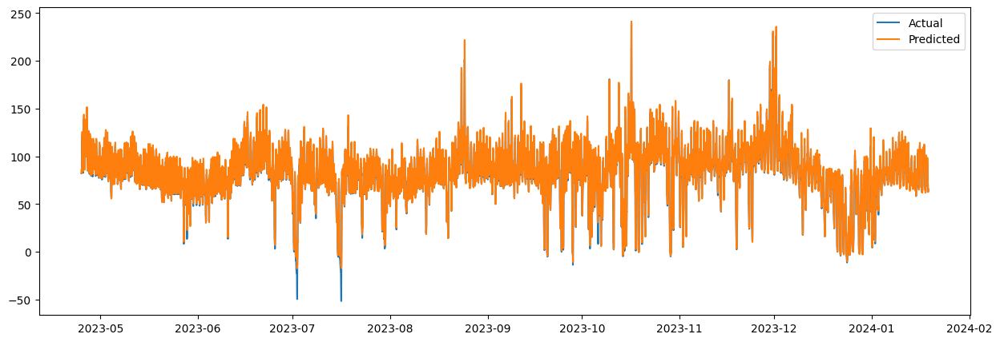

In [97]:
# Make predictions
y_pred = best_model.predict(x_test.drop(columns=["dtm"]))

# Evaluate the model
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f'RMSE: {rmse}')

# Plot results
plt.figure(figsize=(15, 5))
plt.plot(x_test["dtm"], y_test, label='Actual')
plt.plot(x_test["dtm"], y_pred, label='Predicted')
plt.legend()
plt.show()

In [98]:
import joblib

In [99]:
# Save the model to a file using joblib
joblib.dump(best_model, 'energy_demand_forecasting_model.pkl')

['energy_demand_forecasting_model.pkl']

# Explainable AI (XAI) and SHAP Values



In [100]:
 !pip install shap plotly scikit-learn pandas


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 26.3 MB/s eta 0:00:00


In [101]:
import shap
import plotly.express as px
import plotly.graph_objects as go

In [102]:
np.bool = np.bool_

In [103]:
train_data_latest = x_train.drop(columns=["dtm"])
test_data_latest = x_test.drop(columns=["dtm"])

In [104]:
train_data_latest = train_data_latest.astype(float)
test_data_latest = test_data_latest.astype(float)

In [105]:
# train_data_latest.columns

In [106]:
# Initialize SHAP explainer
explainer = shap.TreeExplainer(best_model)

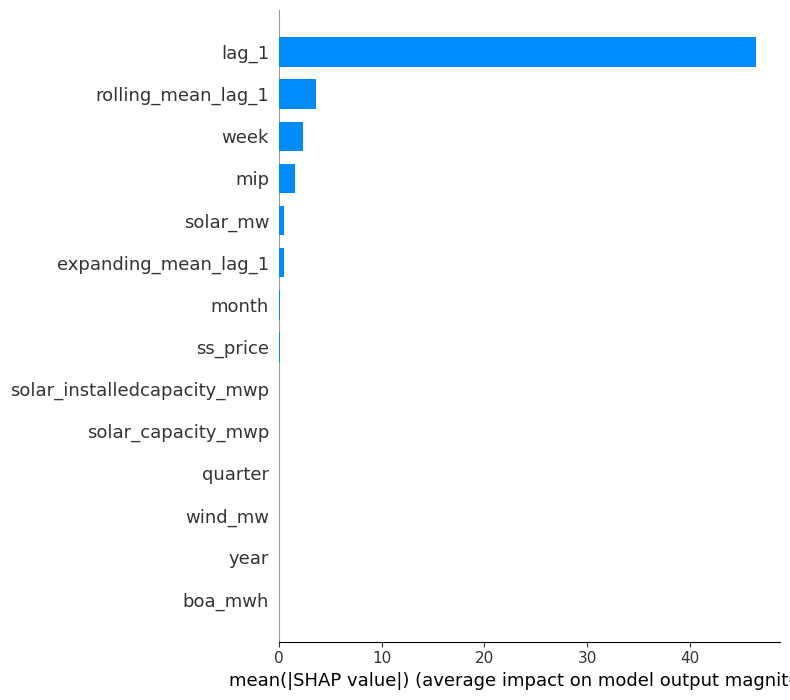

In [107]:
# Visualize one value with a summary plot (bar)
single_shap_value = explainer(test_data_latest.sample(n=1))
shap.summary_plot(single_shap_value, feature_names=test_data_latest.columns, plot_type='bar')
plt.show()

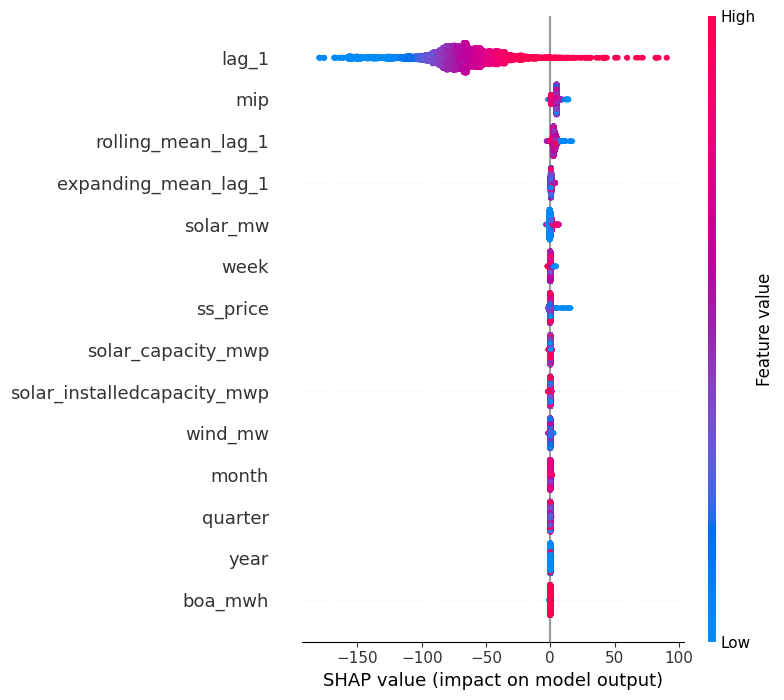

In [108]:
# Visualize all values with a summary plot
shap_values = explainer(test_data_latest)
shap.summary_plot(shap_values, feature_names=test_data_latest.columns)
plt.show()

In [109]:
# Force plot for a single prediction
shap.initjs()
shap.force_plot(explainer.expected_value, single_shap_value.values, test_data_latest.sample(n=1), feature_names=test_data_latest.columns)


In [110]:
shap.initjs()
# Additional example plots:
# Force plot for all predictions (use a subset for better visualization)
shap.force_plot(explainer.expected_value, shap_values.values[:100], test_data_latest.iloc[:100], feature_names=test_data_latest.columns)
# plt.show()